# Agrupamento Cluster

In [1]:
!pip install plotly --upgrade

In [2]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from sklearn.preprocessing import StandardScaler

In [3]:
from sklearn.cluster import KMeans

In [4]:
# Teste com poucos valores

In [5]:
x = [20,27,21,37,46,53,55,47,52,32,39,41,39,48,48] #idade
y = [1000,1200,2900,1850,900,950,2000,2100,3000,5900,4100,5100,7000,5000,6500] # Salário

In [6]:
grafico = px.scatter(x=x, y = y)

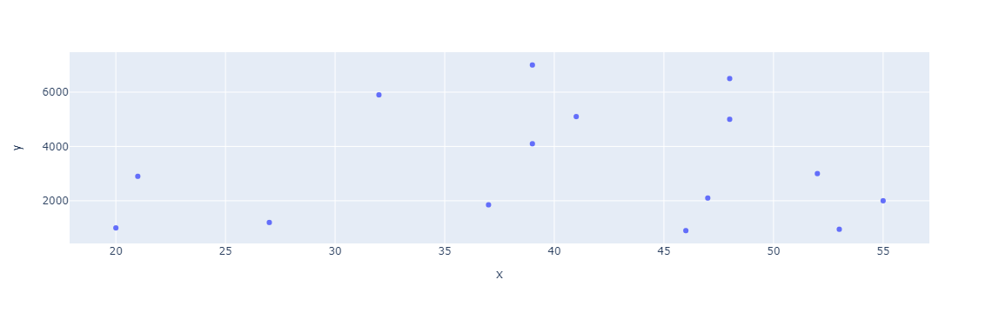

In [7]:
grafico.show();

In [8]:
# Objetivo gerar grupos entre salário e idade de pessoas

In [9]:
base = np.array([[20,100],[27,1200],[21,2900],[37,1850],[46,900],[53,950],[55,2000],[47,2100],[52,3000],[32,5900],[39,4100],[41,5100],[39,7000],[48,5000],[48,6500]])

In [10]:
base

array([[  20,  100],
       [  27, 1200],
       [  21, 2900],
       [  37, 1850],
       [  46,  900],
       [  53,  950],
       [  55, 2000],
       [  47, 2100],
       [  52, 3000],
       [  32, 5900],
       [  39, 4100],
       [  41, 5100],
       [  39, 7000],
       [  48, 5000],
       [  48, 6500]])

In [11]:
scaler_s = StandardScaler()

In [12]:
base = scaler_s.fit_transform(base)
base

array([[-1.87963884, -1.46593525],
       [-1.23255006, -0.95239105],
       [-1.78719758, -0.15873184],
       [-0.30813751, -0.64893312],
       [ 0.52383377, -1.09244856],
       [ 1.17092255, -1.06910564],
       [ 1.35580506, -0.57890437],
       [ 0.61627503, -0.53221853],
       [ 1.0784813 , -0.11204601],
       [-0.77034379,  1.24184324],
       [-0.12325501,  0.40149819],
       [ 0.0616275 ,  0.86835655],
       [-0.12325501,  1.75538743],
       [ 0.70871628,  0.82167071],
       [ 0.70871628,  1.52195825]])

# Depois de escalonado, vamos passar para o algorítimo Kmeans

In [13]:
kmeans_salario = KMeans(n_clusters=3) #RAIZ (15/2) = 2,74 
kmeans_salario.fit(base)

KMeans(n_clusters=3)

In [14]:
centroides = kmeans_salario.cluster_centers_
centroides

array([[-1.63312883, -0.85901938],
       [ 0.73953003, -0.67227604],
       [ 0.07703438,  1.10178573]])

In [15]:
# Centroides dos dados reais
scaler_s.inverse_transform(kmeans_salario.cluster_centers_)

array([[  22.66666667, 1400.        ],
       [  48.33333333, 1800.        ],
       [  41.16666667, 5600.        ]])

In [16]:
rotulos = kmeans_salario.labels_
rotulos

array([0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2])

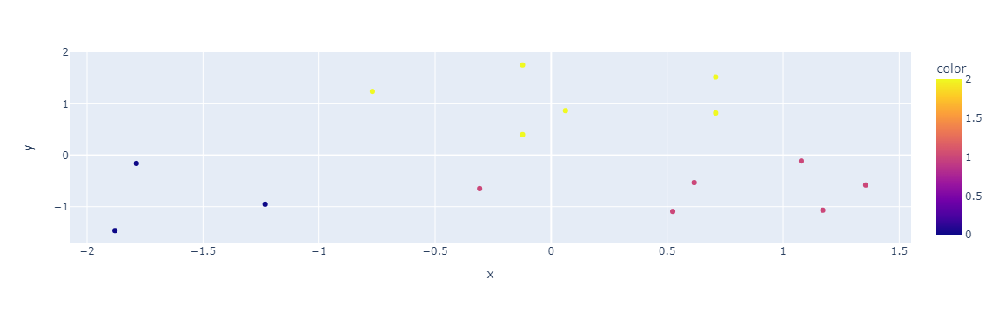

In [17]:
grafico1 = px.scatter(x= base[:,0], y= base[:,1], color = rotulos )
grafico1.show();

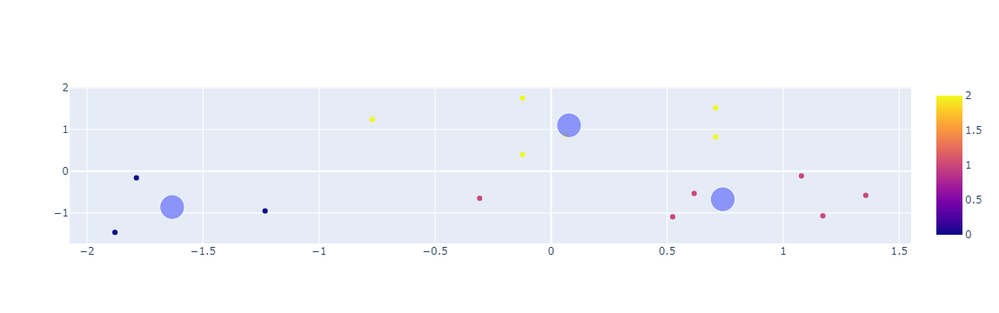

In [18]:
# Gráfico com os centróides
grafico1 = px.scatter(x= base[:,0], y= base[:,1], color = rotulos)
grafico2 = px.scatter(x=centroides[:,0], y=centroides[:,1],size = [12,12,12])
grafico3 = go.Figure(data= grafico1.data + grafico2.data)
grafico3.show();

# Cluster com dados Randômicos

In [19]:
from sklearn.datasets import make_blobs

In [20]:
X_r, y_r = make_blobs(n_samples=200,  centers=5, random_state=1) #center é quantos clusters queremos

In [21]:
X_r.shape, y_r.shape

((200, 2), (200,))

In [22]:
y_r # clusteer

array([0, 2, 3, 2, 2, 3, 4, 3, 2, 0, 3, 3, 4, 1, 3, 0, 0, 1, 2, 2, 0, 3,
       4, 3, 4, 1, 2, 4, 4, 1, 2, 4, 0, 3, 2, 0, 1, 2, 1, 4, 2, 1, 4, 4,
       2, 4, 1, 3, 2, 0, 0, 3, 3, 0, 3, 1, 0, 4, 2, 2, 1, 3, 3, 3, 2, 0,
       0, 1, 4, 2, 1, 4, 2, 4, 4, 1, 2, 3, 0, 4, 1, 1, 3, 2, 3, 0, 2, 2,
       2, 1, 4, 3, 0, 4, 3, 1, 4, 0, 2, 1, 0, 2, 4, 1, 4, 2, 1, 2, 3, 0,
       3, 3, 2, 1, 3, 0, 1, 4, 0, 0, 2, 1, 1, 3, 0, 1, 2, 4, 2, 4, 0, 4,
       3, 3, 1, 1, 3, 0, 0, 3, 3, 3, 0, 0, 4, 2, 4, 0, 2, 3, 4, 3, 0, 4,
       3, 1, 1, 1, 0, 2, 4, 0, 1, 0, 4, 1, 1, 1, 3, 4, 1, 4, 4, 3, 0, 2,
       4, 3, 2, 0, 2, 0, 0, 2, 1, 4, 1, 0, 0, 3, 2, 4, 0, 1, 1, 4, 3, 4,
       2, 1])

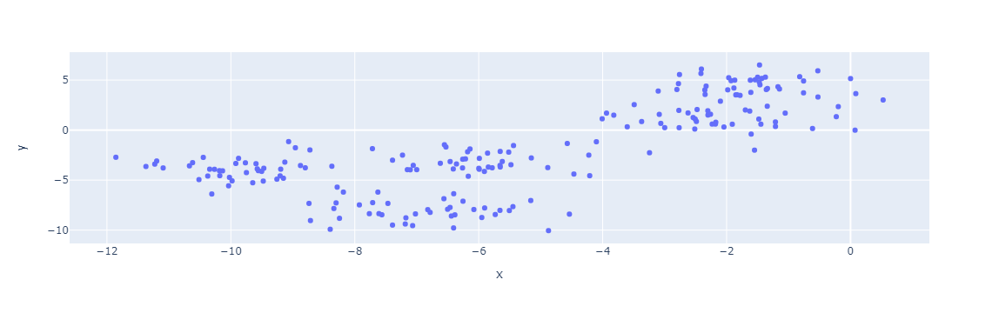

In [23]:
grafico = px.scatter(x = X_r[:,0],y =  X_r[:,1])
grafico.show()

In [24]:
kmeans_blobs = KMeans(n_clusters=5)
kmeans_blobs.fit(X_r)

KMeans(n_clusters=5)

In [25]:
rotulos = kmeans_blobs.predict(X_r) # Pode usar predict para achar os rótulos igual ao outro exemplo
rotulos

array([3, 2, 4, 2, 2, 4, 0, 4, 2, 3, 4, 4, 4, 1, 4, 3, 3, 1, 2, 2, 3, 4,
       0, 4, 0, 1, 2, 0, 0, 1, 2, 0, 3, 4, 2, 3, 1, 2, 1, 3, 1, 1, 0, 0,
       2, 0, 1, 4, 2, 0, 3, 4, 4, 3, 4, 1, 3, 4, 2, 2, 1, 4, 4, 4, 2, 0,
       3, 1, 0, 2, 1, 0, 2, 0, 0, 1, 2, 1, 3, 0, 1, 1, 4, 2, 4, 3, 2, 2,
       2, 1, 0, 4, 3, 0, 4, 1, 0, 3, 2, 1, 3, 2, 0, 1, 0, 2, 1, 2, 4, 3,
       4, 4, 2, 1, 4, 3, 1, 0, 3, 3, 2, 1, 1, 4, 3, 1, 2, 0, 2, 0, 3, 0,
       4, 4, 1, 1, 4, 3, 3, 4, 4, 4, 3, 3, 0, 2, 0, 3, 2, 4, 0, 4, 3, 0,
       4, 1, 1, 1, 3, 2, 0, 3, 1, 3, 0, 1, 1, 1, 4, 0, 1, 0, 0, 4, 3, 2,
       0, 4, 2, 3, 2, 3, 3, 2, 1, 0, 1, 3, 3, 4, 2, 0, 3, 1, 1, 0, 4, 0,
       2, 1])

In [26]:
centroides = kmeans_blobs.cluster_centers_
centroides

array([[-2.17069756,  1.02591979],
       [-9.85620522, -3.91021738],
       [-6.87958999, -8.11648104],
       [-1.58338528,  4.50520457],
       [-5.90368078, -3.04489641]])

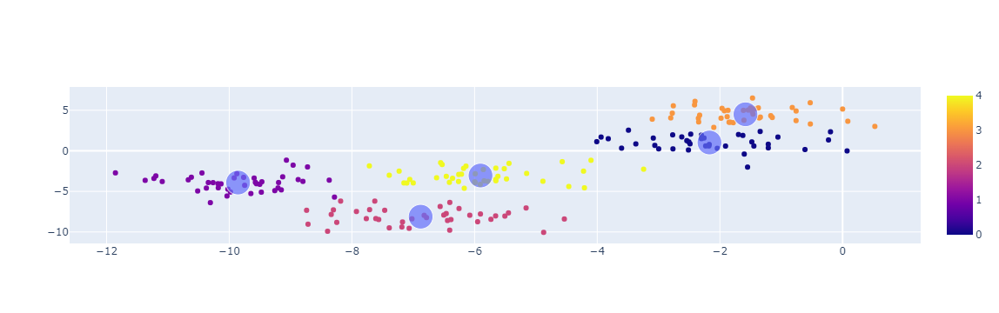

In [27]:
grafico1 = px.scatter(x=X_r[:,0], y=X_r[:,1], color = rotulos)
grafico2 = px.scatter(x=centroides[:,0], y=centroides[:,1], size=[5,5,5,5,5])
grafico3 = go.Figure(data=grafico1.data + grafico2.data)
grafico3.show()

# Cluster em base de Crédito

In [28]:
import pandas as pd
df_cartao = pd.read_csv('credit_card_clients.csv', header=1) # header=1 pois atribuiu que não existia nomes  de coluna
df_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [29]:
# Este DataSet é usado no livro Projetos Data Science
# Pay - se ele pagou ou não (são categorias de -2 a 7)
# Bill Amt é quanto que ele pagou 

In [30]:
df_cartao['BILL_TOTAL'] = df_cartao['BILL_AMT1'] + df_cartao['BILL_AMT2'] + df_cartao['BILL_AMT3'] + df_cartao['BILL_AMT4'] + df_cartao['BILL_AMT5'] + df_cartao['BILL_AMT6'] 

In [31]:
df_cartao.BILL_TOTAL

0          7704
1         17077
2        101653
3        231334
4        109339
          ...  
29995    725349
29996     21182
29997     70496
29998    266611
29999    230874
Name: BILL_TOTAL, Length: 30000, dtype: int64

In [32]:
# Vamos utilizar a coluna limite e pagamento total
X_df = df_cartao.iloc[:,[1,25]].values

In [33]:
X_df

array([[ 20000,   7704],
       [120000,  17077],
       [ 90000, 101653],
       ...,
       [ 30000,  70496],
       [ 80000, 266611],
       [ 50000, 230874]], dtype=int64)

In [34]:
scaler_c = StandardScaler()
X_df = scaler_c.fit_transform(X_df)
X_df

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

# Utilizar a técnica WCSS para encontrar o número de clusters

In [35]:
wcss = []
for i in range(1,11): # teste com 10 clusters (1 ao 11)
    kmeans_cartao = KMeans(n_clusters=i, random_state=0)
    kmeans_cartao.fit(X_df)
    wcss.append(kmeans_cartao.inertia_)

In [36]:
wcss

[60000.00000000003,
 35196.57080583446,
 20128.132558347672,
 14943.80917386596,
 10707.537016753666,
 8603.395384848947,
 7400.069599689453,
 6353.473303353448,
 5665.82385774019,
 5052.188166408732]

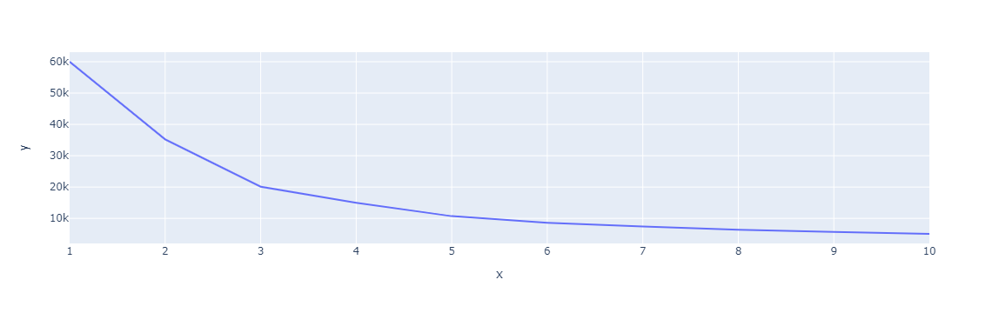

In [37]:
grafico = px.line(x=range(1,11), y = wcss)
grafico.show()

In [38]:
# Usar 4 ou 5 clusters (ultimo que não tem uma queda tão grande)

In [142]:
kmeans_c = KMeans(n_clusters = 4, random_state=0)
rotulos = kmeans_c.fit_predict(X_df)
rotulos

array([0, 0, 0, ..., 0, 0, 0])

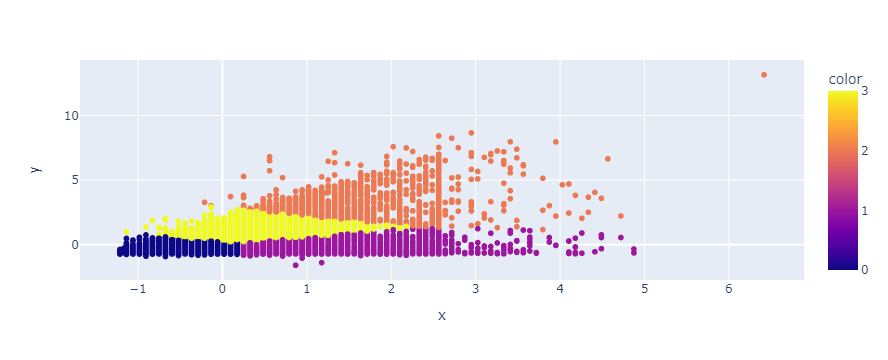

In [148]:
grafico = px.scatter(x=X_df[:,0], y= X_df[:,1], color = rotulos)
grafico.show()

In [41]:
lista_clientes = np.column_stack((df_cartao, rotulos))
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [     2, 120000,      2, ...,      1,  17077,      0],
       [     3,  90000,      2, ...,      0, 101653,      0],
       ...,
       [ 29998,  30000,      1, ...,      1,  70496,      0],
       [ 29999,  80000,      1, ...,      1, 266611,      0],
       [ 30000,  50000,      1, ...,      1, 230874,      0]], dtype=int64)

In [42]:
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()] # Grupos na ultima coluna de 0 a 3
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 16789,  30000,      1, ...,      1,  14274,      0],
       [ 16788,  30000,      1, ...,      1,  90453,      0],
       ...,
       [ 20882, 110000,      1, ...,      0, 554308,      3],
       [ 20744, 220000,      1, ...,      0, 452961,      3],
       [ 20270, 150000,      2, ...,      0, 546939,      3]], dtype=int64)

# Agrupamento com mais atributos da lista (não só com o limite e nem só com o gasto)

In [43]:
X_df2 = df_cartao.iloc[:,[1,2,3,4,5,25]].values
X_df2

array([[ 20000,      2,      2,      1,     24,   7704],
       [120000,      2,      2,      2,     26,  17077],
       [ 90000,      2,      2,      2,     34, 101653],
       ...,
       [ 30000,      1,      2,      2,     37,  70496],
       [ 80000,      1,      3,      1,     41, 266611],
       [ 50000,      1,      2,      1,     46, 230874]], dtype=int64)

In [44]:
X_df2.shape

(30000, 6)

In [45]:
scaler_c2 = StandardScaler()
X_df2 = scaler_c2.fit_transform(X_df2)

In [46]:
X_df2

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.69069198],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.66599747],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.44316987],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.52525745],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.00856436],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.10271861]])

In [47]:
wcss = []
for i in range(1,11): # teste com 10 clusters (1 ao 11)
    kmeans_cartao = KMeans(n_clusters=i, random_state=0)
    kmeans_cartao.fit(X_df2)
    wcss.append(kmeans_cartao.inertia_)

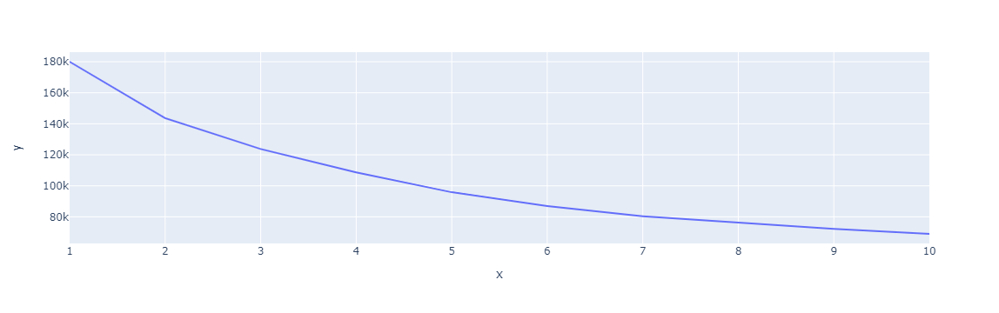

In [48]:
grafico = px.line(x=range(1,11), y = wcss)
grafico.show()

In [50]:
kmeans_cartao = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao.fit_predict(X_df2)
rotulos

array([1, 0, 0, ..., 3, 1, 1])

In [51]:
from sklearn.decomposition import PCA # Depois veremos mais de PCA

In [52]:
pca = PCA(n_components=2)
X_df3 = pca.fit_transform(X_df2)
X_df3

array([[-0.74082054, -1.13671858],
       [-1.48027121, -0.30100547],
       [-0.94737386, -0.48666789],
       ...,
       [-0.79468657, -0.90012663],
       [ 1.17562376, -1.54746987],
       [ 1.13614987, -1.14039836]])

In [53]:
X_df3.shape # temos apenas duas caracteristicas

(30000, 2)

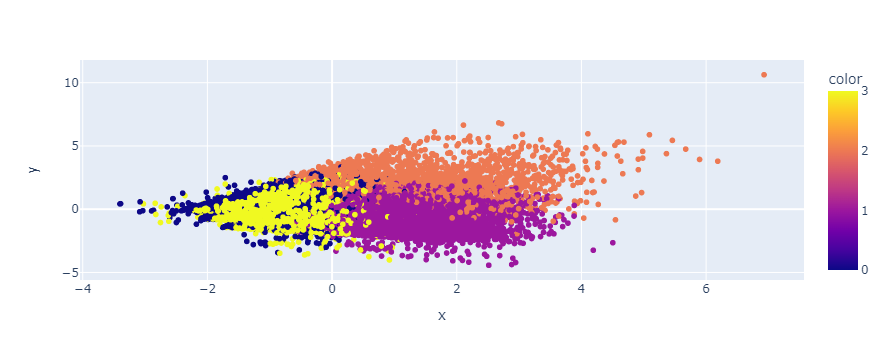

In [54]:
grafico = px.scatter(x=X_df3[:,0], y= X_df3[:,1], color = rotulos)
grafico.show()

In [55]:
# Fica diferente pois combinamos apenas 2 atributos
# PCA é para enxergar o gráfico
# agora vamos colocar na lista ou dataframe

In [56]:
lista_clientes = np.column_stack((df_cartao, rotulos))
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()] # Grupos na ultima coluna de 0 a 3
lista_clientes

array([[ 22235, 250000,      2, ...,      0, 120233,      0],
       [  6902, 300000,      2, ...,      0, 605733,      0],
       [  6903, 180000,      2, ...,      0,  33111,      0],
       ...,
       [  7847,  30000,      1, ...,      1, 168918,      3],
       [  7866,  50000,      1, ...,      0, 132306,      3],
       [ 15000,  50000,      1, ...,      0, 249711,      3]], dtype=int64)

# Agrupamento Hierárquico

In [57]:
# Utiliza uma árvore onde as folhas são os clusters, o fator de decisão é a distância Euclidiana

In [58]:
## Utilizando Base Salário

In [59]:
base

array([[-1.87963884, -1.46593525],
       [-1.23255006, -0.95239105],
       [-1.78719758, -0.15873184],
       [-0.30813751, -0.64893312],
       [ 0.52383377, -1.09244856],
       [ 1.17092255, -1.06910564],
       [ 1.35580506, -0.57890437],
       [ 0.61627503, -0.53221853],
       [ 1.0784813 , -0.11204601],
       [-0.77034379,  1.24184324],
       [-0.12325501,  0.40149819],
       [ 0.0616275 ,  0.86835655],
       [-0.12325501,  1.75538743],
       [ 0.70871628,  0.82167071],
       [ 0.70871628,  1.52195825]])

In [60]:
# Utilizando dendograma
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

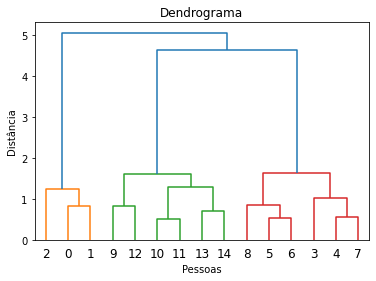

In [61]:
dendograma = dendrogram(linkage(base, method='ward'))
plt.title('Dendrograma')
plt.xlabel('Pessoas')
plt.ylabel('Distância');

In [62]:
# 3 Clusters

In [63]:
from sklearn.cluster import AgglomerativeClustering

In [64]:
hc_salario = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean') 
rotulos = hc_salario.fit_predict(base)

In [65]:
rotulos

array([1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2], dtype=int64)

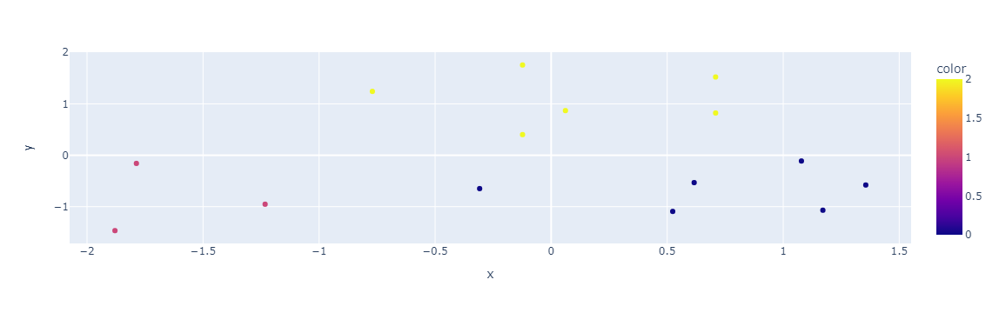

In [66]:
grafico1 = px.scatter(x= base[:,0], y= base[:,1], color = rotulos )
grafico1.show();

# Base de Cartão de Crédito

In [67]:
X_df # Apenas quanto gasta e limite

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

In [68]:
dendrograma1 = dendrogram(linkage(X_df, method = 'ward')) TRAVOU TUDO !!!!!!!!!


In [69]:
hc_cartao =  AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean') 
rotulos = hc_cartao.fit_predict(X_df)

# DBSCAN

In [70]:
# Encontra padorões não lineares
# Robusto contra outliers
# Dificil achar um bom valore para distância

In [71]:
base

array([[-1.87963884, -1.46593525],
       [-1.23255006, -0.95239105],
       [-1.78719758, -0.15873184],
       [-0.30813751, -0.64893312],
       [ 0.52383377, -1.09244856],
       [ 1.17092255, -1.06910564],
       [ 1.35580506, -0.57890437],
       [ 0.61627503, -0.53221853],
       [ 1.0784813 , -0.11204601],
       [-0.77034379,  1.24184324],
       [-0.12325501,  0.40149819],
       [ 0.0616275 ,  0.86835655],
       [-0.12325501,  1.75538743],
       [ 0.70871628,  0.82167071],
       [ 0.70871628,  1.52195825]])

In [72]:
from sklearn.cluster import DBSCAN

In [73]:
dbscan_salario = DBSCAN(eps=0.5, min_samples=2) #eps é o raio de cada ponto, min_samples precisa ter no mínimo 2 para ser um cluster
dbscan_salario.fit(base)

DBSCAN(min_samples=2)

In [75]:
rotulos = dbscan_salario.labels_
rotulos

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1],
      dtype=int64)

In [76]:
# -1 é atribuido como um ruído e não classificou nenhum grupo

In [77]:
dbscan_salario = DBSCAN(eps=0.95, min_samples=2) #eps é o raio de cada ponto, min_samples precisa ter no mínimo 2 para ser um cluster
dbscan_salario.fit(base)

DBSCAN(eps=0.95, min_samples=2)

In [78]:
rotulos = dbscan_salario.labels_
rotulos

array([ 0,  0, -1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2],
      dtype=int64)

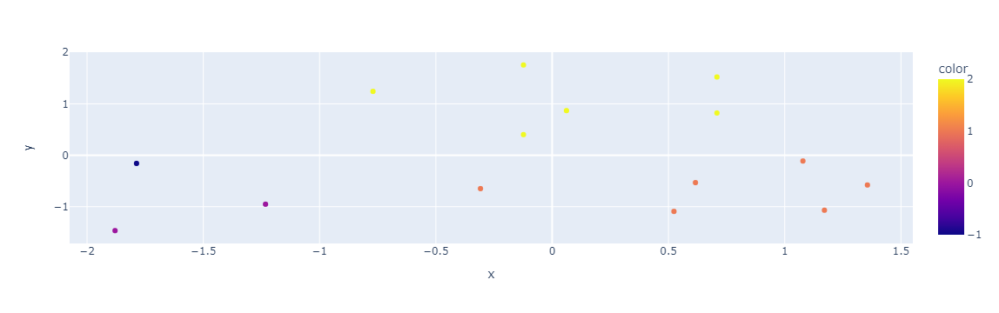

In [79]:
grafico1 = px.scatter(x= base[:,0], y= base[:,1], color = rotulos )
grafico1.show();

# DBSCAN Base de dados cartão de crédito

In [81]:
dbscan_cartao = DBSCAN(eps=0.5, min_samples=5)
rotulos = dbscan_cartao.fit_predict(X_df)

In [82]:
rotulos

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [84]:
np.unique(rotulos, return_counts=True)

(array([-1,  0], dtype=int64), array([   21, 29979], dtype=int64))

In [85]:
# 21 registros ruidos - 29979 um grupo, mudar os parametros

In [130]:
dbscan_cartao = DBSCAN(eps=0.28, min_samples=18)
rotulos = dbscan_cartao.fit_predict(X_df)

In [131]:
rotulos

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [132]:
np.unique(rotulos, return_counts=True)

(array([-1,  0,  1,  2], dtype=int64),
 array([  180, 29768,    33,    19], dtype=int64))

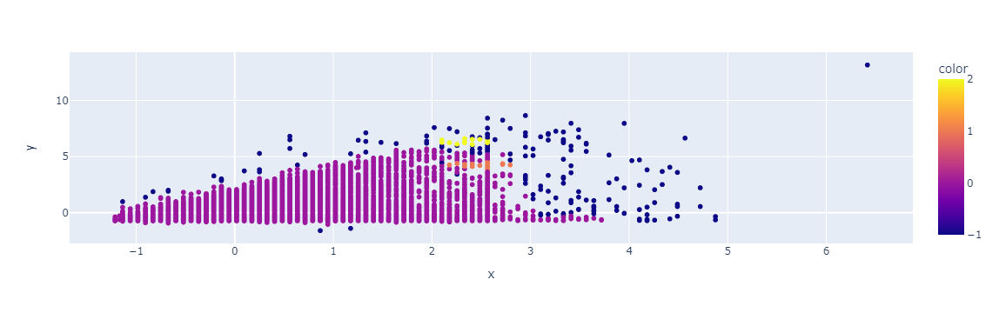

In [133]:
grafico1 = px.scatter(x= X_df[:,0], y= X_df[:,1], color = rotulos )
grafico1.show();

In [99]:
# K-means x Hierárquico x DBSCAN

In [100]:
from sklearn import datasets

In [102]:
X_random, y_random = datasets.make_moons(n_samples=1500, noise = 0.09)

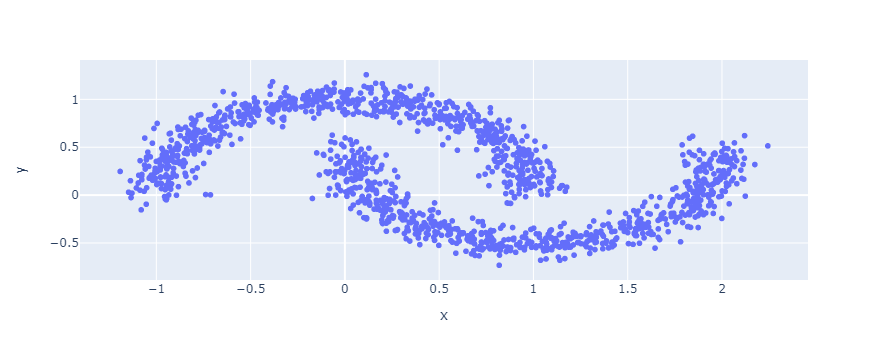

In [104]:
grafico = px.scatter(x= X_random[:,0], y= X_random[:,1])
grafico.show();

# Vamos aplica os tres algorítimos para ver qual se sai melhor


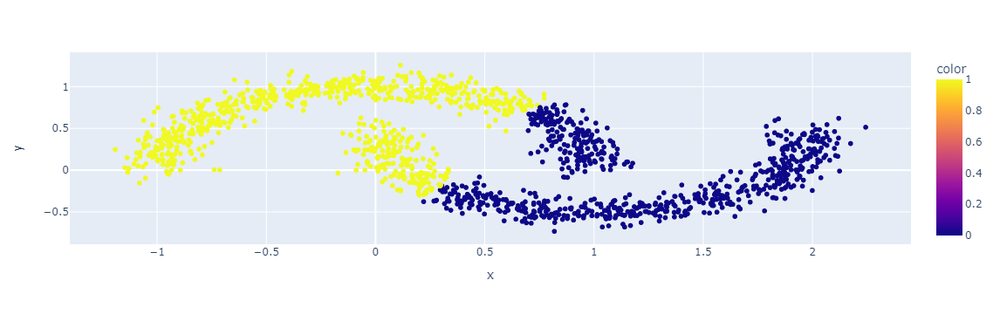

In [105]:
kmeans= KMeans(n_clusters=2)
rotulos = kmeans.fit_predict(X_random)
grafico = px.scatter(x= X_random[:,0], y= X_random[:,1], color= rotulos)
grafico.show();

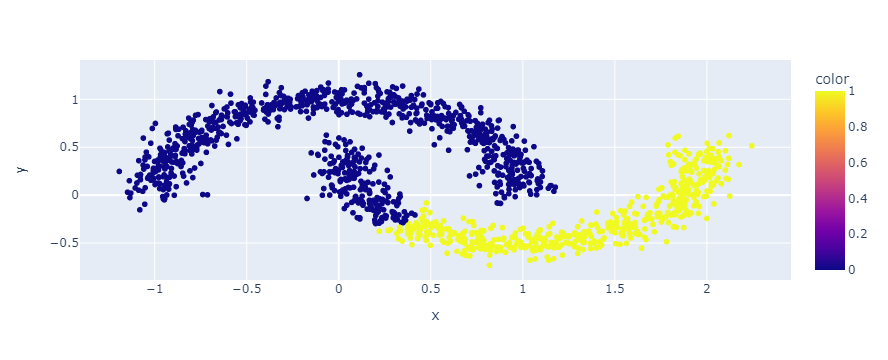

In [106]:
hc =  AgglomerativeClustering(n_clusters=2, linkage='ward', affinity='euclidean')
rotulos = hc.fit_predict(X_random)
grafico = px.scatter(x= X_random[:,0], y= X_random[:,1], color= rotulos)
grafico.show();

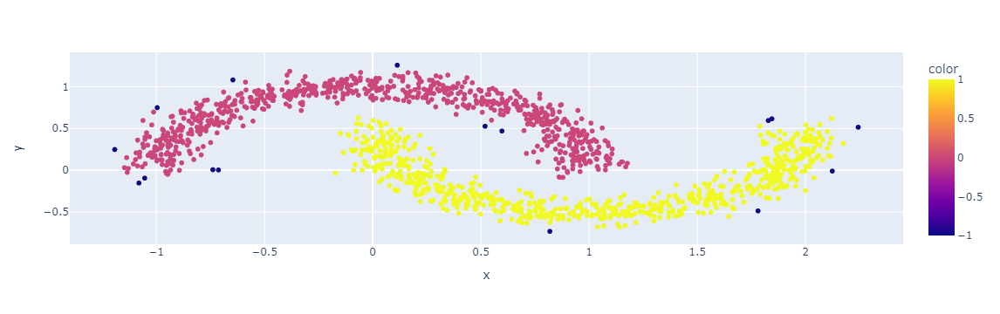

In [109]:
dbscan = DBSCAN(eps=0.1)
rotulos = dbscan.fit_predict(X_random)
grafico = px.scatter(x= X_random[:,0], y= X_random[:,1], color= rotulos)
grafico.show();